In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('diamond.csv')
df.head(5)

,ID,Carat Weight,Cut,Color,Clarity,Polish,Symmetry,Report,Price
0,1,1.10,Ideal,H,SI1,VG,EX,GIA,"$ 5,169"
1,2,0.83,Ideal,H,VS1,ID,ID,AGSL,"$ 3,470"
2,3,0.85,Ideal,H,SI1,EX,EX,GIA,"$ 3,183"
3,4,0.91,Ideal,E,SI1,VG,VG,GIA,"$ 4,370"
4,5,0.83,Ideal,G,SI1,EX,EX,GIA,"$ 3,171"


In [ ]:
df['Report'].value_counts()

,count
Report,
GIA,5266
AGSL,734


In [ ]:
df['Cut'].value_counts()

,count
Cut,
Ideal,2482
Very Good,2428
Good,708
Signature-Ideal,253
Fair,129


Signature-ideal: The best diamond

In [ ]:
df.shape

(6000, 9)

In [ ]:
df["Price"].describe()

,Price
count,6000.000000
mean,11791.579333
std,10184.350051
min,2184.000000
25%,5150.500000
50%,7857.000000
75%,15036.500000
max,101561.000000


In [ ]:
df.isnull().sum()

,0
ID,0
Carat Weight,0
Cut,0
Color,0
Clarity,0
Polish,0
Symmetry,0
Report,0
Price,0


In [ ]:
df['Price'] = df['Price'].str.strip("$ ").str.replace(",", "")

In [ ]:
df['Price'] = pd.to_numeric(df['Price'])

In [ ]:
df['Price']

,Price
0,5169
1,3470
2,3183
3,4370
4,3171
...,...
5995,6250
5996,5328
5997,6157
5998,11206


In [ ]:
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder

# Assume df is your original DataFrame containing many columns,
# including 'cut', 'color', 'clarity', 'polish', 'symmetry', 'report'

# Create a copy of your DataFrame to work on
df_encoded = df.copy()

# Define the ordinal orders for the columns
cut_order = ["Fair", "Good", "Very Good", "Ideal", "Signature-Ideal"]
color_order = ["I", "H", "G", "F", "E", "D"]
clarity_order = ["SI1", "VS2", "VS1", "VVS2", "VVS1", "IF", "FL"]
polish_order = ["G", "ID", "VG", "EX"]
symmetry_order = ["G", "ID", "VG", "EX"]
report_order = ["AGSL", "GIA"]

# Create the OrdinalEncoder with the specified category orders
encoder = OrdinalEncoder(categories=[
    cut_order, color_order, clarity_order, polish_order, symmetry_order, report_order
])

# Apply the encoder only on the specified columns
# This line only replaces the values for the six columns and does not affect any other columns.
df_encoded[['cut', 'color', 'clarity', 'polish', 'symmetry', 'report']] = encoder.fit_transform(
    df[['Cut', 'Color', 'Clarity', 'Polish', 'Symmetry', 'Report']]
)

# Now, df_encoded contains all original columns, with the six specified columns encoded
print(df_encoded.head())


   ID  Carat Weight    Cut Color Clarity Polish Symmetry Report  Price  cut  \
0   1          1.10  Ideal     H     SI1     VG       EX    GIA   5169  3.0   
1   2          0.83  Ideal     H     VS1     ID       ID   AGSL   3470  3.0   
2   3          0.85  Ideal     H     SI1     EX       EX    GIA   3183  3.0   
3   4          0.91  Ideal     E     SI1     VG       VG    GIA   4370  3.0   
4   5          0.83  Ideal     G     SI1     EX       EX    GIA   3171  3.0   

   color  clarity  polish  symmetry  report  
0    1.0      0.0     2.0       3.0     1.0  
1    1.0      2.0     1.0       1.0     0.0  
2    1.0      0.0     3.0       3.0     1.0  
3    4.0      0.0     2.0       2.0     1.0  
4    2.0      0.0     3.0       3.0     1.0  


In [ ]:
df_encoded.head(4)

,ID,Carat Weight,Cut,Color,Clarity,Polish,Symmetry,Report,Price,cut,color,clarity,polish,symmetry,report
0,1,1.10,Ideal,H,SI1,VG,EX,GIA,5169,3.0,1.0,0.0,2.0,3.0,1.0
1,2,0.83,Ideal,H,VS1,ID,ID,AGSL,3470,3.0,1.0,2.0,1.0,1.0,0.0
2,3,0.85,Ideal,H,SI1,EX,EX,GIA,3183,3.0,1.0,0.0,3.0,3.0,1.0
3,4,0.91,Ideal,E,SI1,VG,VG,GIA,4370,3.0,4.0,0.0,2.0,2.0,1.0


In [ ]:
df_encoded.drop(columns={'Cut','Color','Clarity','Polish','Symmetry','Report'}, inplace = True)

In [ ]:
df_encoded.head(4)

,ID,Carat Weight,Price,cut,color,clarity,polish,symmetry,report
0,1,1.10,5169,3.0,1.0,0.0,2.0,3.0,1.0
1,2,0.83,3470,3.0,1.0,2.0,1.0,1.0,0.0
2,3,0.85,3183,3.0,1.0,0.0,3.0,3.0,1.0
3,4,0.91,4370,3.0,4.0,0.0,2.0,2.0,1.0


In [ ]:
df = df_encoded

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df.columns

Index(['ID', 'Carat Weight', 'Price', 'cut', 'color', 'clarity', 'polish',
       'symmetry', 'report'],
      dtype='object')

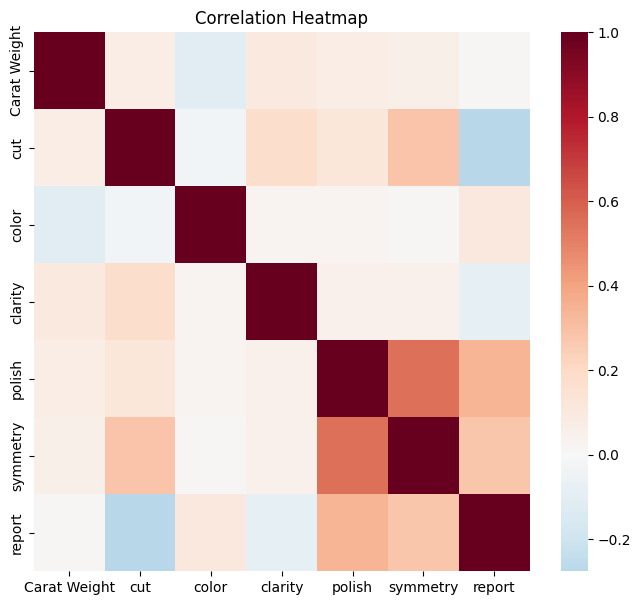

In [ ]:
cols = ['Carat Weight', 'cut', 'color', 'clarity', 'polish',
       'symmetry', 'report']

corr_matrix = df[cols].corr()
plt.figure(figsize=(8,7))
sns.heatmap(corr_matrix, cmap='RdBu_r', center=0)
plt.title("Correlation Heatmap")
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

In [ ]:
X = df.drop('Price', axis=1)
y = df['Price']

#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle = True, random_state = 911)

In [ ]:
from sklearn.pipeline import Pipeline

In [ ]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('regressor', RandomForestRegressor())
])

# Fit the model
pipeline.fit(X_train, y_train)

# Evaluate the model
score = pipeline.score(X_test, y_test)
print("R² score:", score)

R² score: 0.9851264130557971


In [ ]:
cv_scores = cross_val_score(pipeline, X, y, cv=5, scoring='r2')

print("Cross-validation R² scores:", cv_scores)
print("Average R²:", cv_scores.mean())

Cross-validation R² scores: [0.98435707 0.98713147 0.98115322 0.97577923 0.98471954]
Average R²: 0.9826281066763357


In [ ]:
y_pred = pipeline.predict(X_test)

In [ ]:
mae_test = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [ ]:
print("Mean Squared Error:", mae_test)
print("R2 Score:", r2)

Mean Squared Error: 1422266.3145566666
R2 Score: 0.9851264130557971


In [ ]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
scores = []

for train_index, test_index in kf.split(X):
    # Split into training and test subsets
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Create and fit the StandardScaler on the training data only
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    # Transform the test data using the same scaler
    X_test_scaled = scaler.transform(X_test)

    # Train the regressor on the scaled training data
    model = RandomForestRegressor()
    model.fit(X_train_scaled, y_train)

    # Evaluate the model on the scaled test data
    score = model.score(X_test_scaled, y_test)
    scores.append(score)

# Print the cross-validation scores and the average score
print("Cross-validation R² scores:", scores)
print("Average R²:", np.mean(scores))

Cross-validation R² scores: [0.9853581765509246, 0.9827744903087037, 0.9788684397287917, 0.9815887143764478, 0.9822575536987035]
Average R²: 0.9821694749327143


In [ ]:
y_pred = model.predict(X_test_scaled)

In [ ]:
mae_test = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [ ]:
print("Mean Squared Error:", mae_test)
print("R2 Score:", r2)

Mean Squared Error: 1746395.6386835002
R2 Score: 0.9822575536987035


In [ ]:
import numpy as np

In [ ]:
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]
features = X.columns

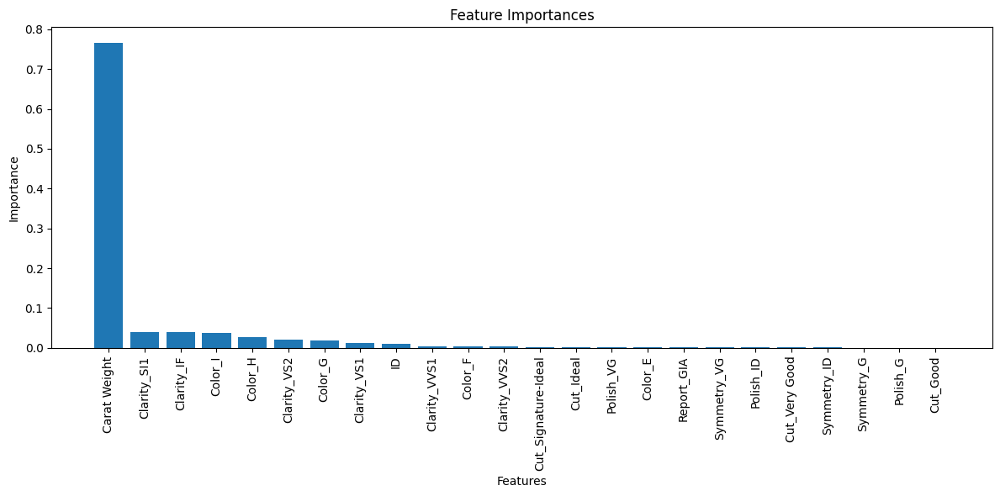

In [ ]:
plt.figure(figsize=(12, 6))
plt.title("Feature Importances")
plt.bar(range(len(importances)), importances[indices], align="center")
plt.xticks(range(len(importances)), features[indices], rotation=90)
plt.xlabel("Features")
plt.ylabel("Importance")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
}


# Use the RandomForestRegressor instance in GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_split': [2, 5],
                         'n_estimators': [100, 200]},
             scoring='r2')

In [ ]:
print("Best parameters found:", grid_search.best_params_)
print("Best CV score:", grid_search.best_score_)

# Final model using the best parameters
best_rf = grid_search.best_estimator_
final_predictions = best_rf.predict(X_test_scaled)
final_mse = mean_squared_error(y_test, final_predictions)
final_r2 = r2_score(y_test, final_predictions)
print("Final Model Mean Squared Error:", final_mse)
print("Final Model R2 Score:", final_r2)

Best parameters found: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}
Best CV score: 0.9818880004414441
Final Model Mean Squared Error: 95286945.58124174
Final Model R2 Score: 0.031935560452844625


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Pick one tree from the forest
estimator = best_rf.estimators_[0]

# Export the tree in DOT format
export_graphviz(
    estimator,
    out_file="tree.dot",
    feature_names=X.columns,
    rounded=True,
    precision=2,
    filled=True
)

# Convert to a visual graph
with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)


In [ ]:
!pip install shap
import shap

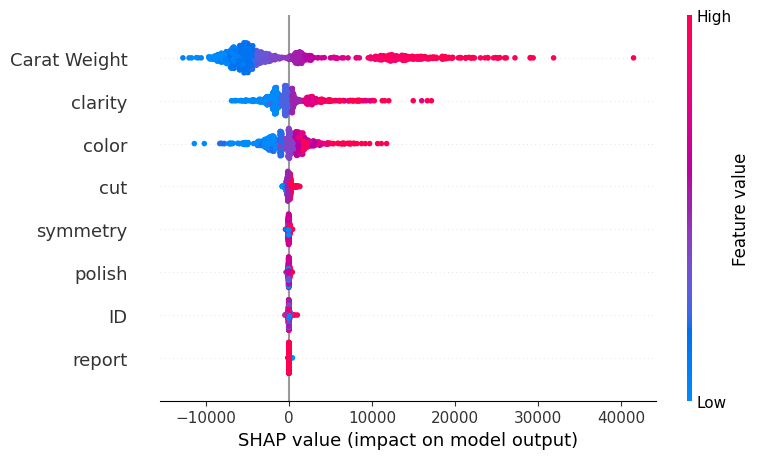

In [ ]:
# Create a SHAP explainer
explainer = shap.TreeExplainer(best_rf)
shap_values = explainer.shap_values(X_test_scaled)

shap.summary_plot(shap_values, X_test_scaled)

In [ ]:
# Pick one diamond from X_test
sample_idx = 10
shap.force_plot(explainer.expected_value, shap_values[sample_idx], X_test_scaled.iloc[sample_idx,:])

AttributeError: 'numpy.ndarray' object has no attribute 'iloc'

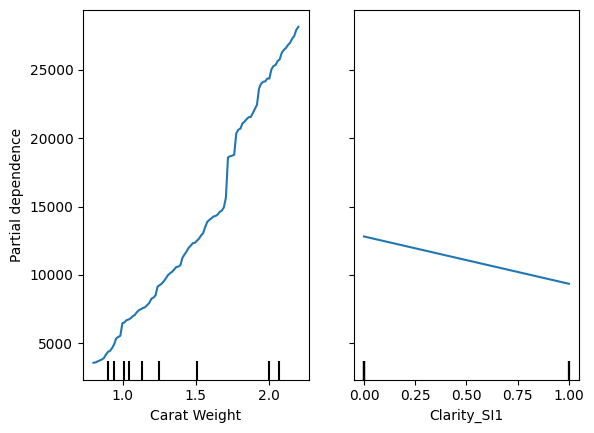

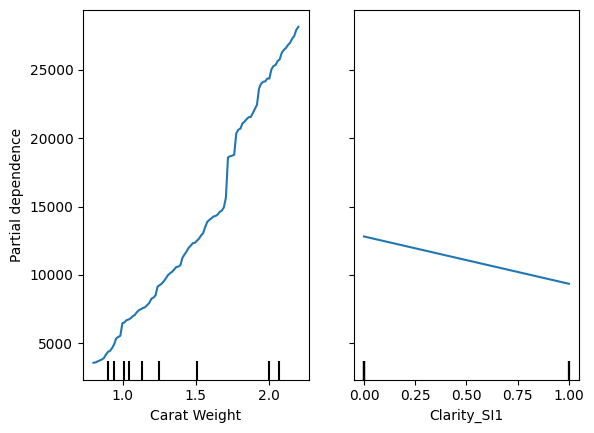

In [ ]:
from sklearn.inspection import PartialDependenceDisplay

# Create the partial dependence plot
display = PartialDependenceDisplay.from_estimator(
    best_rf,
    X,
    features=['Carat Weight', 'Clarity_SI1'],  # Update feature names to match your DataFrame
    kind='average' # or 'both' to include individual conditional expectation (ICE) plots
)

# Show the plot
display.plot()
plt.show() # this might be needed depending on your environment

In [ ]:
# Example: Ranking diamonds within a certain budget
budget_low = 3000
budget_high = 5000
subset = df[(df['Price'] >= budget_low) & (df['Price'] <= budget_high)]

# Predict using your final model
subset_features = subset.drop('Price', axis=1)
subset['predicted_price'] = best_rf.predict(subset_features)

# Compute a "value score" = actual_price / predicted_price
subset['value_score'] = subset['Price'] / subset['predicted_price']

# Sort by value score descending
top_recommendations = subset.sort_values('value_score', ascending=False).head(5)

<ipython-input-98-fe7670de3873>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['predicted_price'] = best_rf.predict(subset_features)
<ipython-input-98-fe7670de3873>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['value_score'] = subset['Price'] / subset['predicted_price']


In [ ]:
df.columns

Index(['ID', 'Carat Weight', 'Price', 'cut', 'color', 'clarity', 'polish',
       'symmetry', 'report'],
      dtype='object')

In [ ]:
print(top_recommendations[['Price','Carat Weight', 'cut', 'color', 'clarity', 'polish',
       'symmetry', 'report']])
#Include dummy columns for Clarity

      Price  Carat Weight  cut  color  clarity  polish  symmetry  report
975    4435          0.90  2.0    2.0      0.0     2.0       2.0     1.0
5988   4320          0.90  2.0    2.0      0.0     3.0       2.0     1.0
5196   4492          0.90  3.0    0.0      2.0     3.0       3.0     1.0
341    3643          0.81  2.0    4.0      0.0     2.0       0.0     1.0
1139   3671          0.78  3.0    4.0      0.0     3.0       3.0     1.0


In [ ]:
from sklearn.tree import export_graphviz
import graphviz

# Suppose rf is your trained RandomForestRegressor
# Extract a single tree (for example, the first tree)
single_tree = model.estimators_[0]

# Export it in DOT format
export_graphviz(
    single_tree,
    out_file='tree.dot',
    feature_names=X.columns,  # Your feature column names
    rounded=True,
    precision=2,
    filled=True
)

# Convert to a visual graph
with open("tree.dot") as f:
    dot_graph = f.read()
graphviz.Source(dot_graph)


### For a “What diamond should Erick buy?”:
- Decide on the criteria (budget, preference for clarity vs. color, etc.).
- Use your trained Random Forest to predict or evaluate how “good” each diamond is.
-Visualize the top candidates, highlighting how each attribute (carat, color, clarity, cut) affects the model’s predicted price or overall value.
- Optionally use SHAP or Partial Dependence Plots to give a user-friendly explanation of why the model ranks certain diamonds higher.

In [ ]:
import pandas as pd
from sklearn.preprocessing import OrdinalEncoder

# Sample DataFrame
df = pd.DataFrame({
    'cut': ['Fair', 'Good', 'Very Good', 'Ideal'],
    'color': ['I', 'H', 'G', 'F'],
    'clarity': ['SI1', 'VS2', 'VS1', 'VVS2'],
    'polish': ['G', 'ID', 'VG', 'EX'],
    'symmetry': ['G', 'VG', 'ID', 'EX'],
    'report': ['AGSL', 'GIA', 'AGSL', 'GIA'],
    'Carat Weight': [0.7, 0.8, 0.9, 1.0],  # Some other column
})

cut_order = ["Fair", "Good", "Very Good", "Ideal", "Signature-Ideal"]
color_order = ["I", "H", "G", "F", "E", "D"]
clarity_order = ["SI1", "VS2", "VS1", "VVS2", "VVS1", "IF", "FL"]
polish_order = ["G", "ID", "VG", "EX"]
symmetry_order = ["G", "ID", "VG", "EX"]
report_order = ["AGSL", "GIA"]

encoder = OrdinalEncoder(categories=[
    cut_order, color_order, clarity_order,
    polish_order, symmetry_order, report_order
])

# Encode the 6 ordinal columns
cols_to_encode = ['cut','color','clarity','polish','symmetry','report']
df_encoded = df.copy()
df_encoded[cols_to_encode] = encoder.fit_transform(df[cols_to_encode])

print("Encoded Data:\n", df_encoded)

# Inverse transform those same 6 columns
df_decoded = df_encoded.copy()
df_decoded[cols_to_encode] = encoder.inverse_transform(df_encoded[cols_to_encode])

print("Decoded Data:\n", df_decoded)

Encoded Data:
    cut  color  clarity  polish  symmetry  report  Carat Weight
0  0.0    0.0      0.0     0.0       0.0     0.0           0.7
1  1.0    1.0      1.0     1.0       2.0     1.0           0.8
2  2.0    2.0      2.0     2.0       1.0     0.0           0.9
3  3.0    3.0      3.0     3.0       3.0     1.0           1.0
Decoded Data:
          cut color clarity polish symmetry report  Carat Weight
0       Fair     I     SI1      G        G   AGSL           0.7
1       Good     H     VS2     ID       VG    GIA           0.8
2  Very Good     G     VS1     VG       ID   AGSL           0.9
3      Ideal     F    VVS2     EX       EX    GIA           1.0


In [ ]:
print(top_recommendations[['Price','Carat Weight', 'cut', 'color', 'clarity', 'polish',
       'symmetry', 'report']])
#Include dummy columns for Clarity

      Carat Weight  Price  cut  color  clarity  polish  symmetry  report
975           0.90   4435  2.0    2.0      0.0     2.0       2.0     1.0
5988          0.90   4320  2.0    2.0      0.0     3.0       2.0     1.0
5196          0.90   4492  3.0    0.0      2.0     3.0       3.0     1.0
1139          0.78   3671  3.0    4.0      0.0     3.0       3.0     1.0
341           0.81   3643  2.0    4.0      0.0     2.0       0.0     1.0


In [ ]:
def create_download_link(df, title="Download CSV file", filename="data.csv"):
    csv = df.to_csv(index=False)
    b64 = base64.b64encode(csv.encode()).decode()
    html = f'<a download="{filename}" href="data:text/csv;base64,{b64}" target="_blank">{title}</a>'
    return HTML(html)

display(create_download_link(submission_df, filename="diabetes_predictions.csv"))